# 🎨 지브리스타일 이미지를 파이썬으로 생성하기

OpenAI의 새로운 `gpt-image-1` 모델을 사용해 Python으로 자유롭게 이미지를 생성해보기

In [ ]:
## 필요한 패키지 다운로드 (가상환경에서 이미 설치했으면 스킵!)
!pip install openai


[notice] A new release of pip is available: 24.0 -> 25.1
[notice] To update, run: python.exe -m pip install --upgrade pip


## 패키지 불러오기 + API 클라이언트 설정

In [ ]:
from openai import OpenAI
import base64
from IPython.display import Image, display
from IPython.display import HTML
from dotenv import load_dotenv
load_dotenv()


# OpenAI CLient 선언 : .env에서 API Key 설정했으면 자동으로 인식됨
client = OpenAI()

## 기본 이미지 1개 생성하기


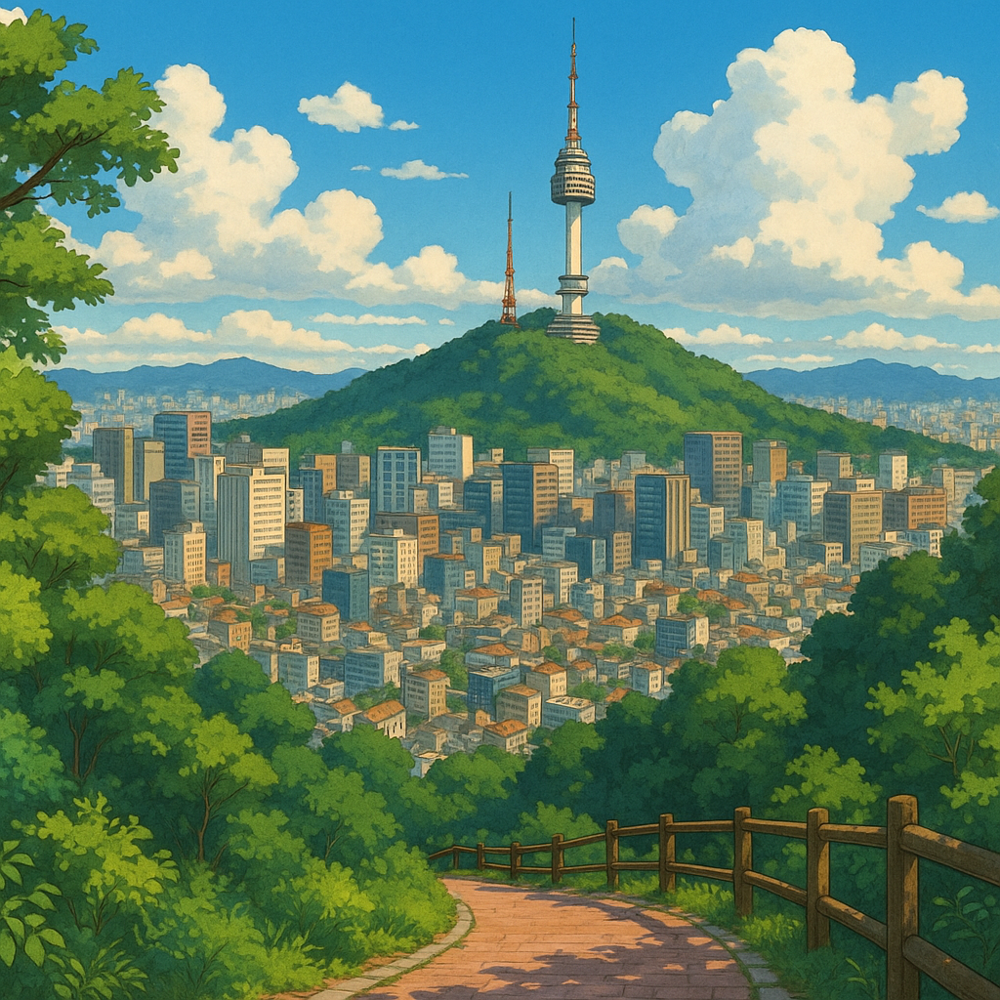

In [35]:

prompt = "지브리 스타일로 서울 남산의 멋진 풍경 그려줘"

result = client.images.generate(
    model="gpt-image-1",
    prompt=prompt,
    size="1024x1024",  # 1024x1024`, `1536x1024` (landscape), `1024x1536` (portrait), 또는 `auto` 
    quality="high" # high, medium, low
)

image_base64 = result.data[0].b64_json
image_bytes = base64.b64decode(image_base64)
# 이미지 미리보기
html = f'<img src="data:image/png;base64,{image_base64}" height="300">'
display(HTML(html))
# 만약 다운로드하고 싶은 경우 아래 명령어
with open("ghibli_image.png", "wb") as f:
    f.write(image_bytes)


## 여러 장 이미지 생성하기 (n=2)


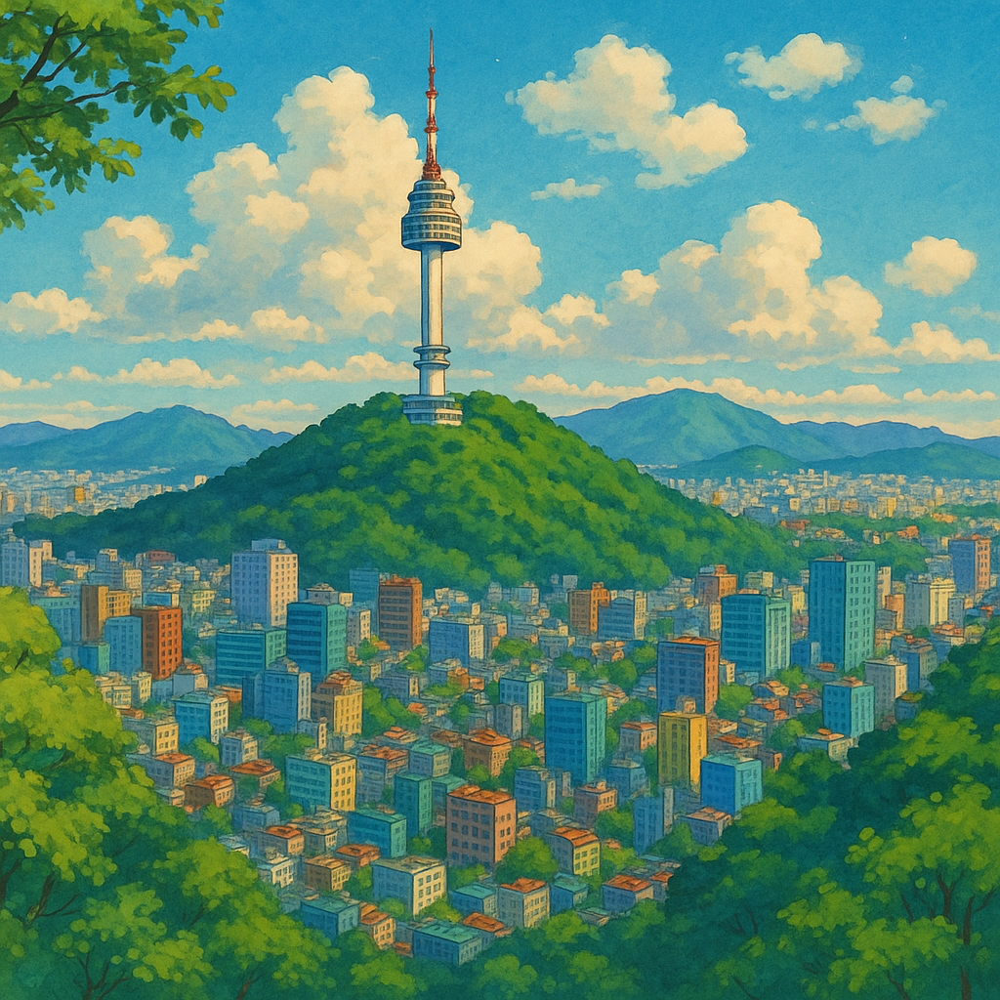
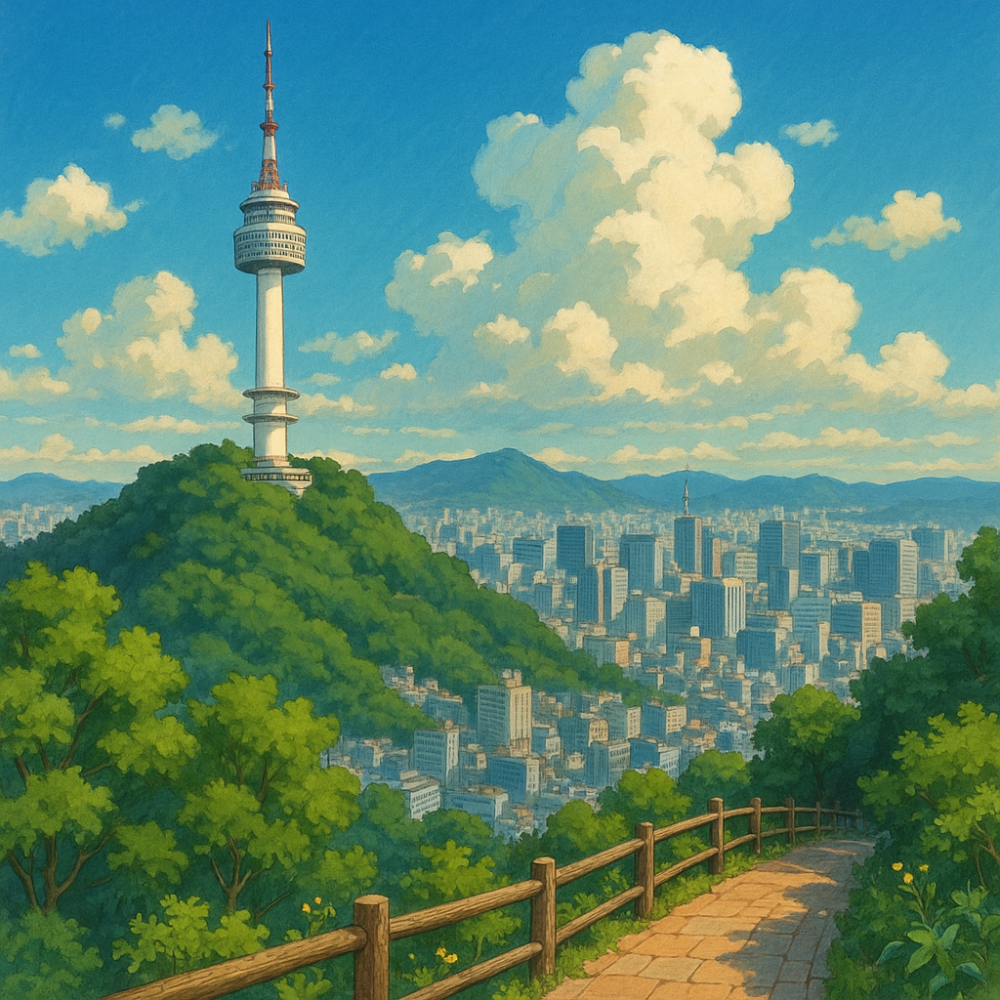

In [33]:
# 2가지 종류의 이미지 생성
prompt = "지브리 스타일로 서울 남산의 멋진 풍경 그려줘"
result = client.images.generate(
    model="gpt-image-1",
    prompt=prompt,
    size="1024x1024",
    quality="high",
    n=2
)

# 이미지들을 하나의 HTML로 나란히 정렬
html_images = ""
for idx, img_data in enumerate(result.data):
    image_base64 = img_data.b64_json
    html_images += f'<img src="data:image/png;base64,{image_base64}" height="300" style="display:inline-block; margin-right:10px;">'

# 전체를 한 번에 출력
display(HTML(html_images))


## 투명 배경으로 생성하기


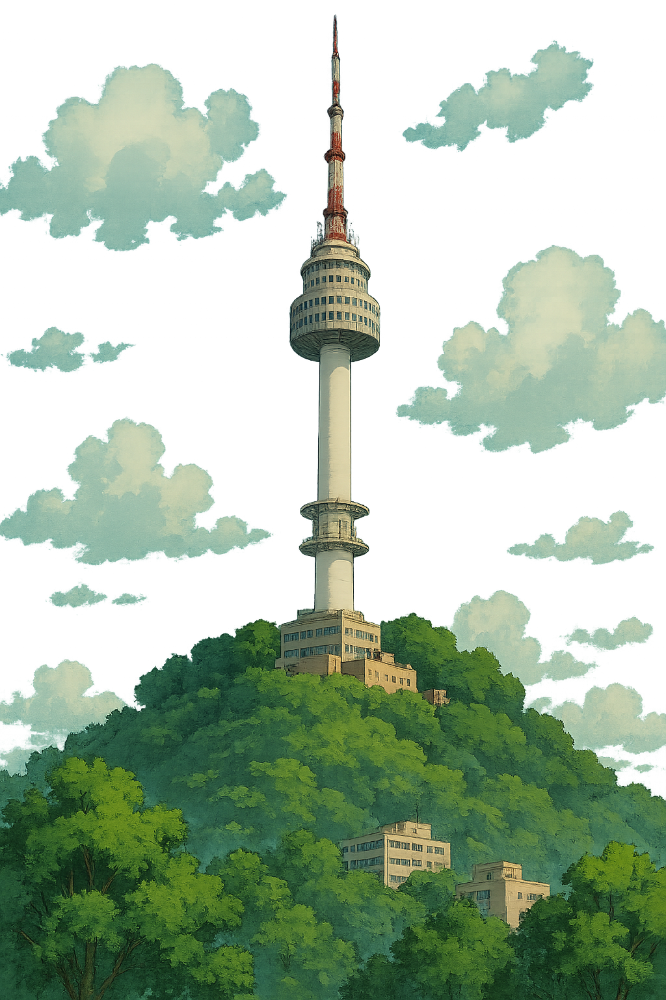

In [ ]:
prompt = "지브리스타일 남산 타워"
result = client.images.generate(
    model="gpt-image-1",
    prompt=prompt,
    size="1024x1024",
    quality="high",
    n=2,
    background="transparent"
)

image_base64 = result.data[0].b64_json
image_bytes = base64.b64decode(image_base64)

html = f'<img src="data:image/png;base64,{image_base64}" height="300">'
display(HTML(html))

## 간단한 이미지 편집하기 (prompt 이용)


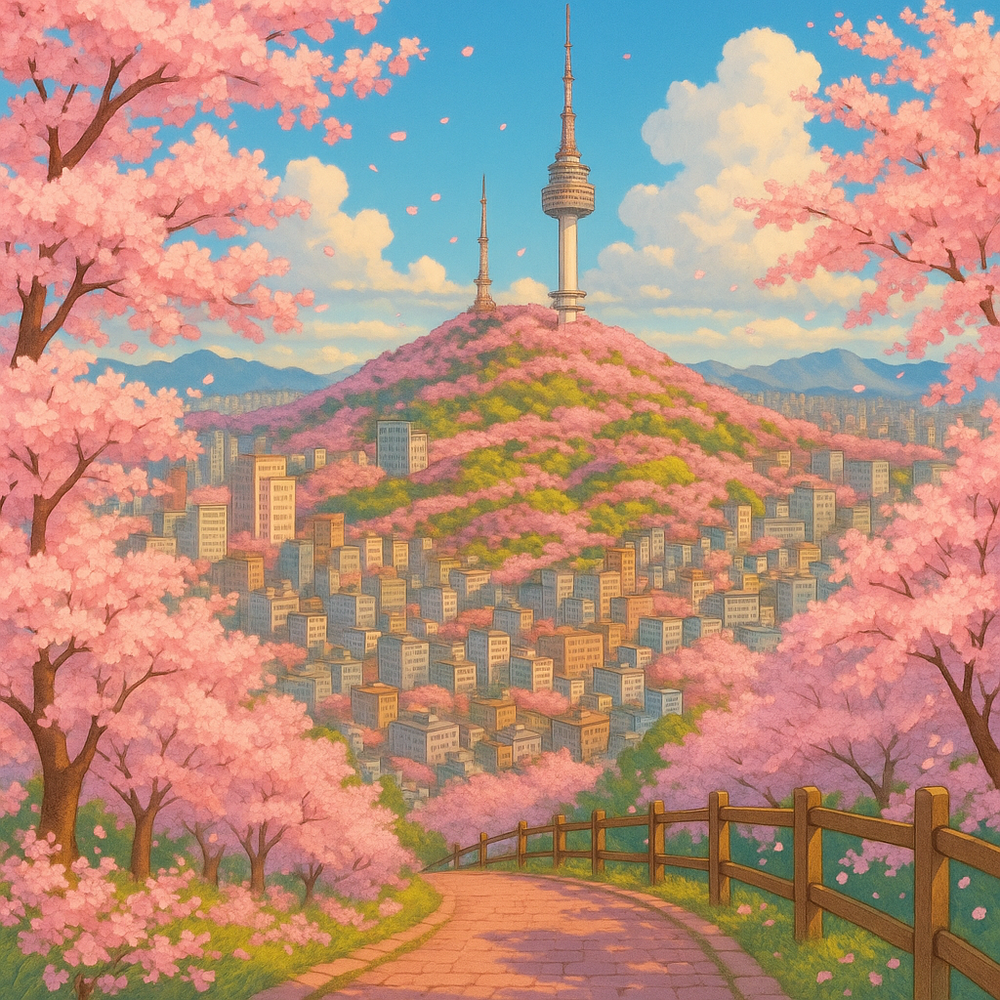

In [36]:
img1 = open('ghibli_image.png', "rb")

prompt = "벚꽃이 만개한 남산타워의 멋진 풍경을 그려줘"

result = client.images.edit(
    model="gpt-image-1",
    image=[img1],
    prompt=prompt,
    size="1024x1024",
    quality="high",
)

image_base64 = result.data[0].b64_json
image_bytes = base64.b64decode(image_base64)
html = f'<img src="data:image/png;base64,{image_base64}" height="600">'
display(HTML(html))
